# 2025-07-27: Refinement and junk cell removal across BMMC lineages [Stochastic]
### By [Aishwarya Chander](aishwarya.chander@alleninstitute.org), High Resolution Translational Immunology, Allen Institute for Immunology
**Main aim**: This notebook visually inspects each L1 lineage subset (T cells, monocytes, progenitors, NK cells, DCs, B cells) using marker gene expression and UMAP to identify misannotated clusters. DC subtypes (cDC1, cDC2-ISG, ASDC) are manually corrected based on cluster position, and junk clusters are flagged per lineage. B cells receive additional sub-resolution Leiden clustering to resolve a mixed cluster. All junk cell flags and corrected labels are consolidated into a single parquet file for downstream filtering.

## 1. Imports

In [2]:
import glob
import os

import anndata
import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import concurrent.futures

sc.settings.n_jobs = 30
sc.settings.verbosity = 0

plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (5, 5)

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

## 2. L1 View

In [3]:
# Get all matching h5ad files
files = glob.glob('../../../data/rna/bmmc-cleanup/cleanup-l1-*.h5ad')

# Load each file into a dict with basename as key (minus path and extension)
adata_dict = {
    os.path.basename(f).replace('cleanup-l1-', '').replace('.h5ad', ''):
    sc.read_h5ad(f, backed='r')
    for f in files
}

# labs = adata_whole.obs[['manual.label_l1', 'manual.label_l2', 'manual.label_l3']]
# for key, adata in adata_dict.items():
#     adata.obs = adata.obs.merge(labs, on='barcodes', how='left')

## 3. Plot so many plots with lineage markers

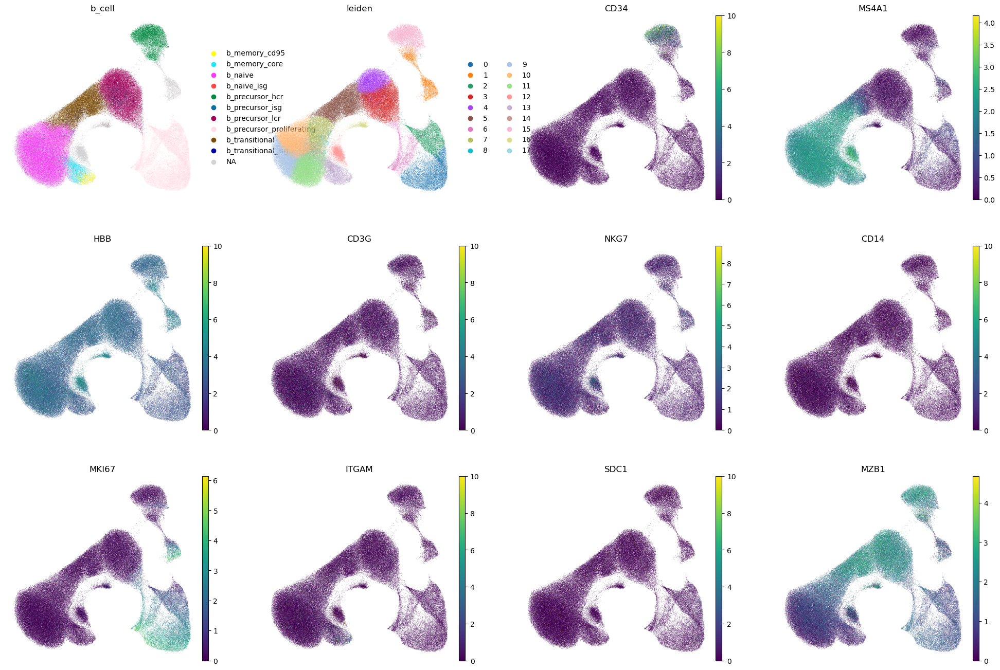

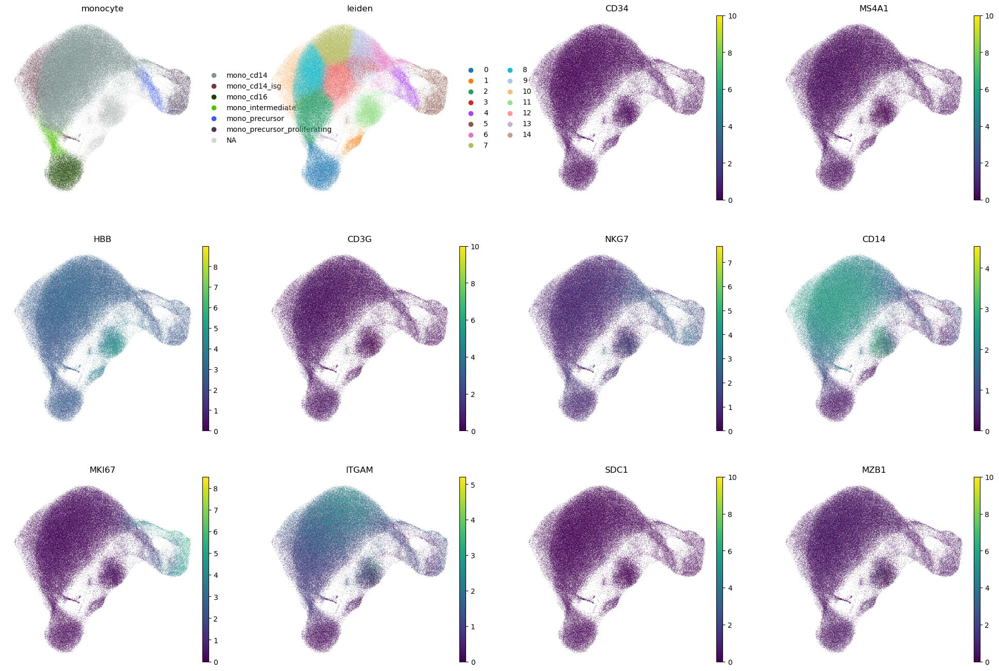

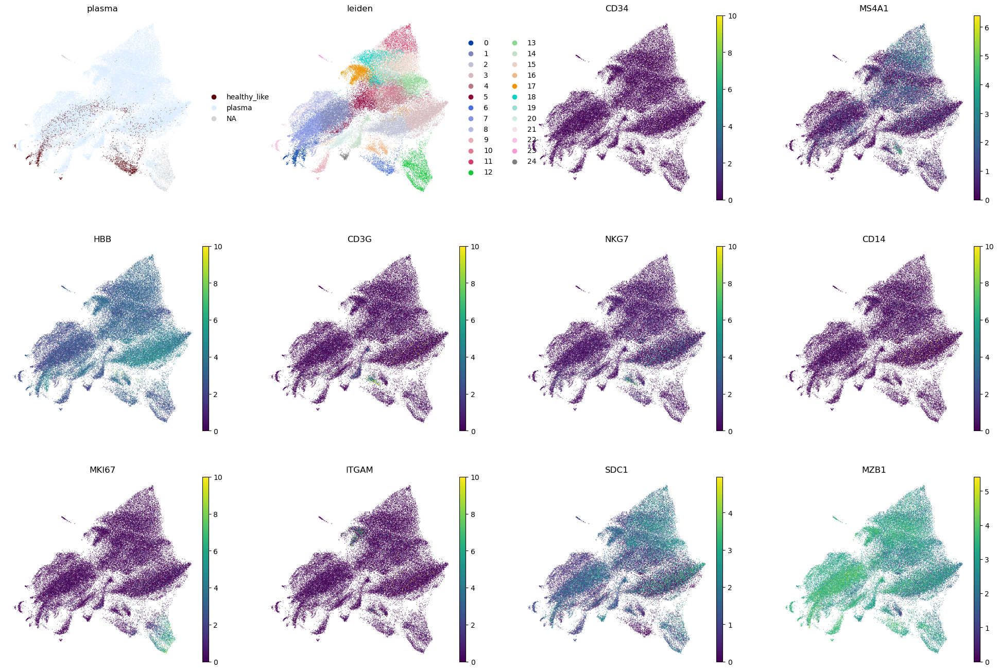

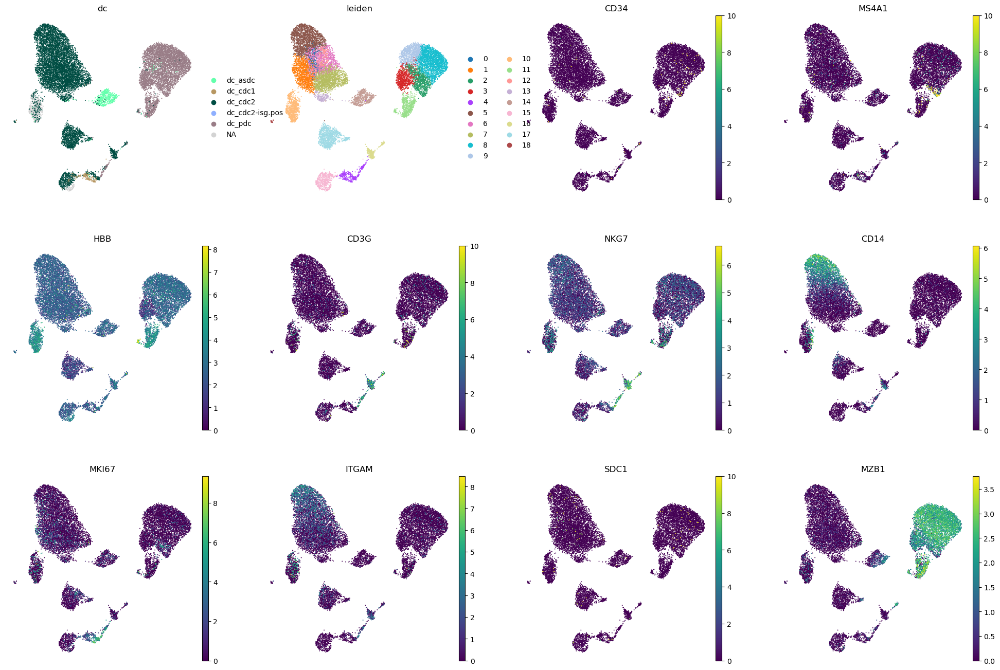

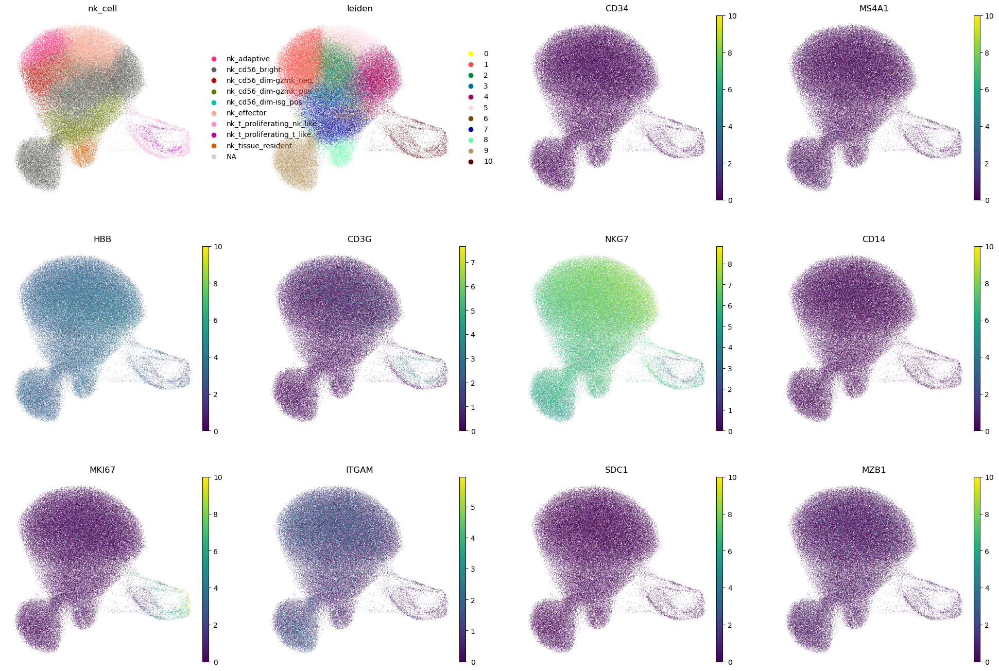

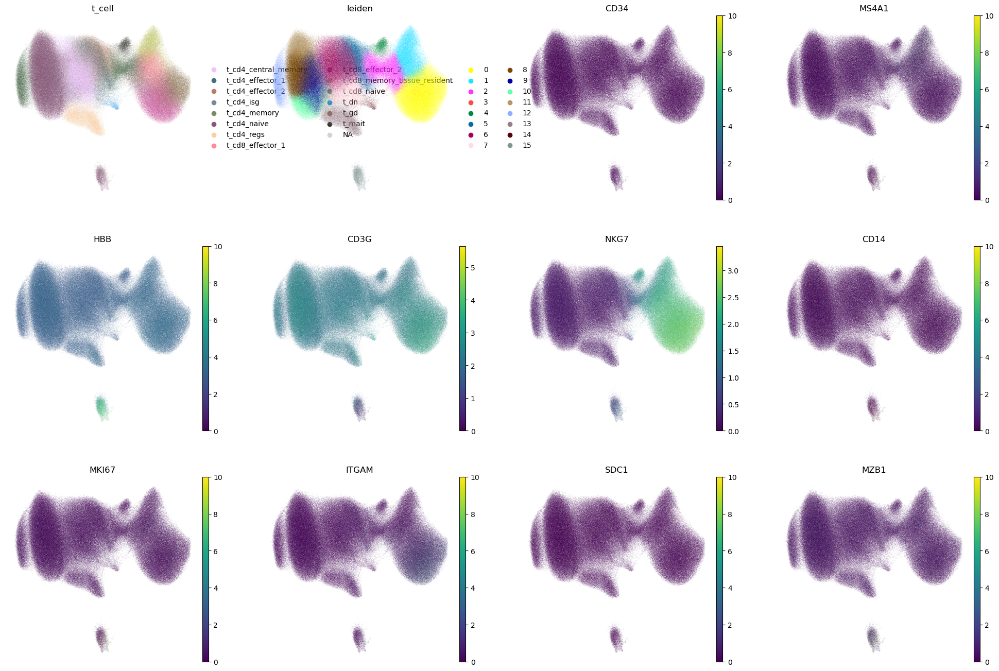

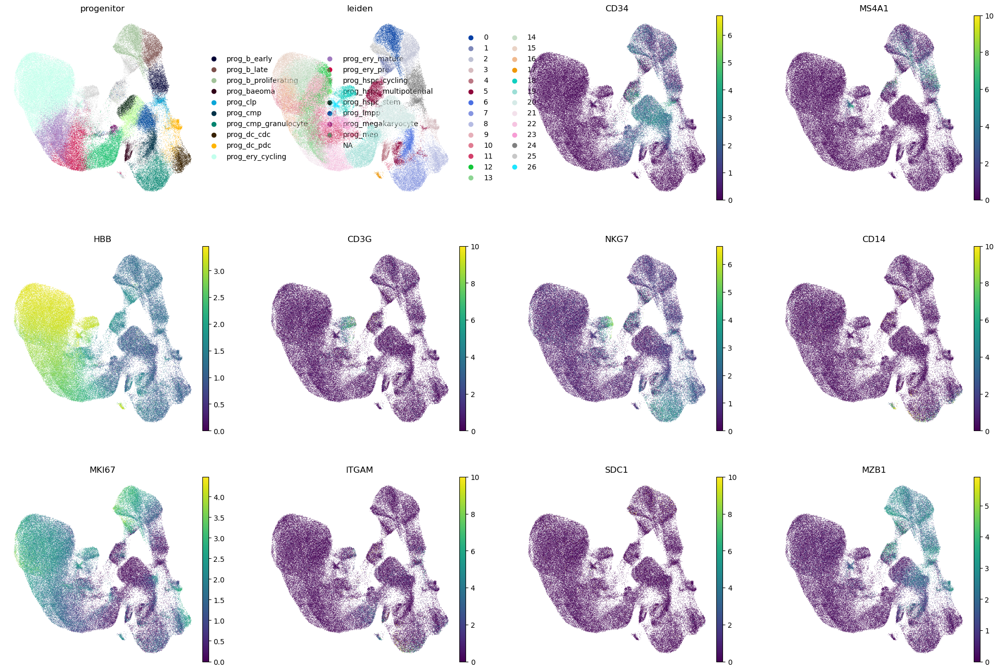

In [15]:
for key, adata in adata_dict.items():
    sc.pl.umap(adata, color=['aifi_celltype_l3', 'leiden', 'CD34', 'MS4A1', 'HBB', 'CD3G', 'NKG7', 'CD14', 'MKI67', 'ITGAM', 'SDC1', 'MZB1'], wspace=0.2, use_raw=False, frameon=False, title=key, show=True)

## 4.  Remove clusters that do not need any edits

In [4]:
all_junk_cells = []

In [5]:
adata_dict['t_cell'].obs['junk_cells'] = adata_dict['t_cell'].obs['leiden'].isin(['15'])
all_junk_cells.append(adata_dict['t_cell'].obs[['aifi_celltype_l3_knn', 'junk_cells']])

In [6]:
adata_dict['monocyte'].obs['junk_cells'] = adata_dict['monocyte'].obs['leiden'].isin(['1', '11', '13', '14'])
all_junk_cells.append(adata_dict['monocyte'].obs[['aifi_celltype_l3_knn', 'junk_cells']])

In [7]:
adata_dict['progenitor'].obs['junk_cells'] = adata_dict['progenitor'].obs['leiden'].isin(['1', '5', '17', '18', '26'])
all_junk_cells.append(adata_dict['progenitor'].obs[['aifi_celltype_l3_knn', 'junk_cells']])

In [8]:
adata_dict['nk_cell'].obs['junk_cells'] = False
all_junk_cells.append(adata_dict['nk_cell'].obs[['aifi_celltype_l3_knn', 'junk_cells']])

## 5. Dendritic Cell Clean Up

In [10]:
dcs = sc.read_h5ad('../../../data/rna/bmmc-cleanup/cleanup-l1-dc.h5ad')

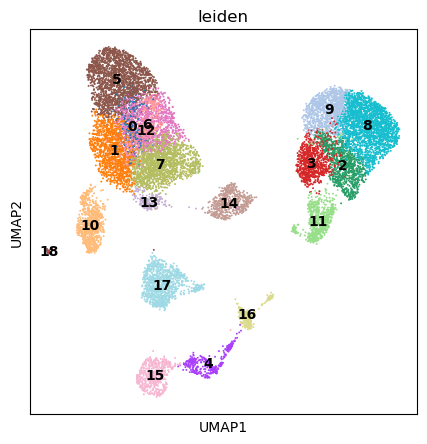

In [11]:
sc.pl.umap(dcs, color='leiden', legend_loc='on data')

In [13]:
dcs.obs.loc[
    dcs.obs['leiden'].isin(["0"]), 
    'aifi_celltype_l3_knn'
] = 'dc_cdc2-isg.pos'


dcs.obs.loc[
    dcs.obs['leiden'].isin(["4", "15"]), 
    'aifi_celltype_l3_knn'
] = 'dc_cdc1'

dcs.obs.loc[
    dcs.obs['leiden'].isin(["13", "14"]), 
    'aifi_celltype_l3_knn'
] = 'dc_asdc'

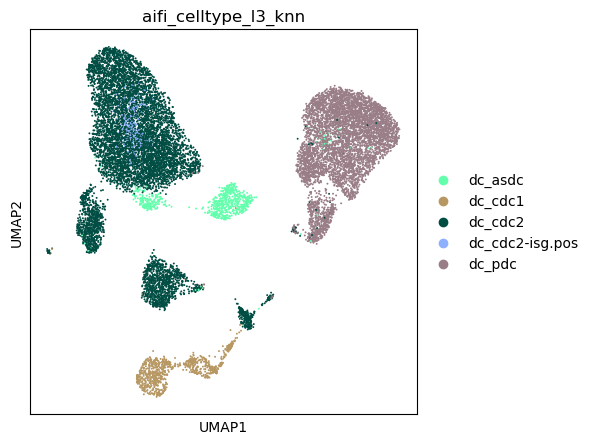

In [14]:
sc.pl.umap(dcs, color='aifi_celltype_l3_knn')

In [15]:
dcs.obs['junk_cells'] = dcs.obs['leiden'].isin(['18', '16'])
all_junk_cells.append(dcs.obs[['aifi_celltype_l3_knn', 'junk_cells']])

## 6. B Cell Clean Up

In [16]:
bcs = sc.read_h5ad('../../../data/rna/bmmc-cleanup/cleanup-l1-b_cell.h5ad')

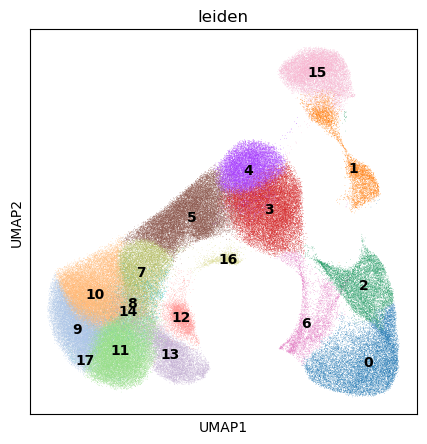

In [17]:
sc.pl.umap(bcs, color='leiden', legend_loc='on data')

In [18]:
sc.tl.leiden(bcs, restrict_to=['leiden', ['1']], resolution=0.2, flavor="igraph", n_iterations=2)

In [19]:
bcs.obs['junk_cells'] = bcs.obs['leiden_R'].isin(['1,1', '12', '16'])
all_junk_cells.append(bcs.obs[['aifi_celltype_l3_knn', 'junk_cells']])

## 7. Put it all together

In [24]:
flat_junk_cells = pd.concat(all_junk_cells)

In [26]:
flat_junk_cells.to_parquet('../../../data/rna/bmmc-labels/nonplasma_cleaned_labels.parquet')